In [1]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import glob
import os,sys
import fitsio as fio
import matplotlib as mpl
from matplotlib import pyplot as plt
from tqdm import tqdm
import proplot as pplt
import pickle
import pandas as pd
import json
import galsim
import subprocess
from matplotlib.colors import LogNorm
from des_y6utils import viz, mdet
from pizza_cutter.slice_utils.locate import build_slice_locations
import h5py as h5
import healsparse
import subprocess
from des_y6utils import mdet
%matplotlib inline

In [2]:
from astropy.visualization import LinearStretch, LogStretch
from astropy.visualization import ZScaleInterval, MinMaxInterval
from astropy.visualization import ImageNormalize
from astropy.io.fits import getdata
%matplotlib inline

In [16]:
mdet_cat = '/global/cfs/cdirs/des/y6-shear-catalogs/master/metadetect_2024-11-07.hdf5'
weight_file = '/pscratch/sd/m/myamamot/des-y6-analysis/y6_measurement/v6_UNBLINDED/inverse_variance_weight_v6.pickle'
nz_cat = '/global/cfs/cdirs/des/boyan/sompz_output/y6_data_10000Tile_final_unblind/sompz_v6_10000Tile_final_unblind_24-11-05.h5'
f = h5.File(mdet_cat, 'r'); d = f.get('noshear/tomo_bin_0')
f_nz = h5.File(nz_cat, 'r'); d_nz = f.get('sompz/noshear')

## Visualize moderate S/N and large size object

In [3]:
d = h5.File('/global/cfs/cdirs/des/y6-shear-catalogs/Y6A2_METADETECT_V6_UNBLINDED/metadetect_cutsv6_all.h5','r')
x = np.array(d['/mdet/noshear/x'][:]); y = np.array(d['/mdet/noshear/y'][:])
slice_id = np.array(d['/mdet/noshear/slice_id'][:])
tilename = np.array(d['/mdet/noshear/tilename'][:])
s2n = np.array(d['/mdet/noshear/gauss_s2n'][:])
sizer = np.array(d['/mdet/noshear/gauss_T_ratio'][:])

In [4]:
msk = ((s2n > 20) & (s2n < 40) & (sizer > 3.0) & (sizer < 5.0))
x = x[msk]; y = y[msk]
slice_id = slice_id[msk]; tilename = tilename[msk]

In [5]:
outpath = "/global/cfs/cdirs/des/myamamot/image_visualizations/data/mids2n_largesizer/"
idx_random = np.random.choice(np.arange(len(x)), 100, replace=False)
for idx in tqdm(idx_random):
    
    obj_tile = tilename[idx].astype('str')
    obj_x = x[idx]; obj_y = y[idx]
    
    if not os.path.exists(os.path.join('/pscratch/sd/m/myamamot/des-y6-analysis/data/color_images', obj_tile+'-gri.jpg')):
        # print('downloading...')
        try:
            subprocess.run("wget --user des --password 70chips -P /global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images https://www.cosmo.bnl.gov/Private/gpfs/workarea/desdata/jpg/Y6A1_COADD/"+obj_tile+"/"+obj_tile+"-gri.jpg", shell=True, capture_output=True)
        except:
            print('downloading not successful')

    obj_x = int(obj_x) # int(obj['x'])
    obj_y = int(10000 - obj_y) # int(10000-obj['y'])

    im = plt.imread(f"""/global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images/{obj_tile}-gri.jpg""", format='jpg')
    im_cutout = im[obj_y-32:obj_y+32, obj_x-32:obj_x+32]
    fio.write(outpath+obj_tile+'_gri'+str(idx)+'.fits', im_cutout)

  0%|          | 0/100 [00:00<?, ?it/s]/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/PIL/Image.py:2832: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 100/100 [06:44<00:00,  4.05s/it]


['DES0002-4331' 'DES0007-3123' 'DES0007-4457' 'DES0008+0126'
 'DES0011-3457' 'DES0013-5748' 'DES0015-3457' 'DES0019+0001'
 'DES0025-3832' 'DES0035-3832' 'DES0036-4123' 'DES0039-3749'
 'DES0105+0126' 'DES0107-1458' 'DES0108-3706' 'DES0108-6539'
 'DES0116-0624' 'DES0123-5040' 'DES0125-0207' 'DES0127-3914'
 'DES0128-3249' 'DES0131-1458' 'DES0133-6414' 'DES0134+0209'
 'DES0134-0250' 'DES0134-3206' 'DES0135-1207' 'DES0136-3706'
 'DES0137+0335' 'DES0137-4540' 'DES0139-3623' 'DES0140-1958'
 'DES0143-2623' 'DES0152+0418' 'DES0154-0915' 'DES0158-6456'
 'DES0159-0833' 'DES0203-1832' 'DES0207-4249' 'DES0209-3957'
 'DES0223-1958' 'DES0224-3040' 'DES0225-3623' 'DES0230-0958'
 'DES0230-1332' 'DES0231-4831' 'DES0232-0750' 'DES0232-1415'
 'DES0232-3540' 'DES0237-1624' 'DES0238-4540' 'DES0241+0500'
 'DES0250-2623' 'DES0257-1915' 'DES0300-0707' 'DES0307-5040'
 'DES0322-3914' 'DES0325-3749' 'DES0328-4457' 'DES0328-6122'
 'DES0331-3540' 'DES0339-6039' 'DES0342-3957' 'DES0344-2124'
 'DES0349-3206' 'DES0402

<ipython-input-7-b98e4e1d20fe>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


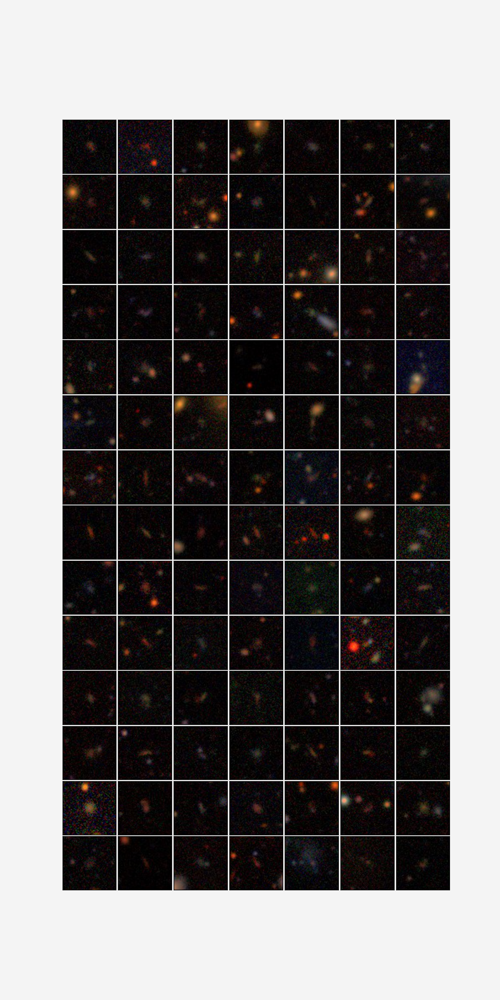

In [7]:
tile_start = 0
fs = np.array(glob.glob('/global/cfs/cdirs/des/myamamot/image_visualizations/data/mids2n_largesizer/DES*.fits'))
tilenames = np.array([f.split('/')[-1].split('_')[0] for f in fs])
print(np.unique(tilenames))
layout = np.arange(98).reshape(14, 7)
fig,ax = plt.subplot_mosaic(layout, figsize=(7,14), gridspec_kw={"wspace": 0.03,"hspace": 0.03,})
n = None

for i,filename in enumerate(fs):
    if i == 98:
        break

    dgri = fio.read(filename)

    norm = ImageNormalize(dgri, interval=ZScaleInterval(), stretch=LinearStretch())
    ax[i].imshow(dgri, norm=norm, origin='lower')
    ax[i].set_xticklabels([]); ax[i].set_xticks([])
    ax[i].set_yticklabels([]); ax[i].set_yticks([])
    

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0)
plt.savefig(outpath+'mods2n_largesizer.png', bbox_inches='tight')

## Visualize odd color object

In [7]:
d = h5.File('/global/cfs/cdirs/des/y6-shear-catalogs/Y6A2_METADETECT_V6_UNBLINDED/metadetect_cutsv6_patch106.h5','r')
x = np.array(d['/mdet/noshear/x'][:]); y = np.array(d['/mdet/noshear/y'][:])
slice_id = np.array(d['/mdet/noshear/slice_id'][:])
tilename = np.array(d['/mdet/noshear/tilename'][:])
mag_g = mdet._compute_asinh_mags(np.array(d['/mdet/noshear/pgauss_band_flux_g'][:]), 0)
mag_r = mdet._compute_asinh_mags(np.array(d['/mdet/noshear/pgauss_band_flux_r'][:]), 1)
mag_i = mdet._compute_asinh_mags(np.array(d['/mdet/noshear/pgauss_band_flux_i'][:]), 2)
mag_z = mdet._compute_asinh_mags(np.array(d['/mdet/noshear/pgauss_band_flux_z'][:]), 3)

In [8]:
msk = ((mag_g - mag_r < -5) | (mag_g - mag_r > 5))
x = x[msk]; y = y[msk]
slice_id = slice_id[msk]; tilename = tilename[msk]

In [11]:
outpath = "/global/cfs/cdirs/des/myamamot/image_visualizations/data/odd_colors/"
idx_random = np.random.choice(np.arange(len(x)), 100, replace=False)
for idx in tqdm(idx_random):
    
    obj_tile = tilename[idx].astype('str')
    obj_x = x[idx]; obj_y = y[idx]
    
    if not os.path.exists(os.path.join('/pscratch/sd/m/myamamot/des-y6-analysis/data/color_images', obj_tile+'-gri.jpg')):
        # print('downloading...')
        try:
            subprocess.run("wget --user des --password 70chips -P /global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images https://www.cosmo.bnl.gov/Private/gpfs/workarea/desdata/jpg/Y6A1_COADD/"+obj_tile+"/"+obj_tile+"-gri.jpg", shell=True, capture_output=True)
        except:
            print('downloading not successful')

    obj_x = int(obj_x) # int(obj['x'])
    obj_y = int(10000 - obj_y) # int(10000-obj['y'])

    im = plt.imread(f"""/global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images/{obj_tile}-gri.jpg""", format='jpg')
    im_cutout = im[obj_y-32:obj_y+32, obj_x-32:obj_x+32]
    fio.write(outpath+obj_tile+'_gri'+str(idx)+'.fits', im_cutout)

  0%|          | 0/100 [00:00<?, ?it/s]/global/homes/m/myamamot/miniforge3/envs/eastlake-dev/lib/python3.8/site-packages/PIL/Image.py:2832: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 100/100 [06:05<00:00,  3.65s/it]


['DES0552-4249' 'DES0553-4331' 'DES0556-4123' 'DES0556-4206'
 'DES0556-4249' 'DES0557-4331' 'DES0557-4414' 'DES0558-4457'
 'DES0600-4040' 'DES0600-4206' 'DES0600-4249' 'DES0601-4331'
 'DES0602-4457' 'DES0604-4040' 'DES0604-4206' 'DES0604-4249'
 'DES0605-4331' 'DES0605-4414' 'DES0606-4457' 'DES0606-4540'
 'DES0607-4123' 'DES0608-4206' 'DES0608-4331' 'DES0609-4414'
 'DES0610-4457' 'DES0611-4123' 'DES0612-4206' 'DES0612-4249'
 'DES0614-4457' 'DES0615-4040' 'DES0615-4206' 'DES0616-4249'
 'DES0616-4331' 'DES0617-4414' 'DES0618-4457' 'DES0619-4123'
 'DES0619-4206' 'DES0620-4249' 'DES0620-4331' 'DES0621-4414'
 'DES0622-4457' 'DES0624-4331' 'DES0625-4414']


<ipython-input-13-e45b567f1169>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


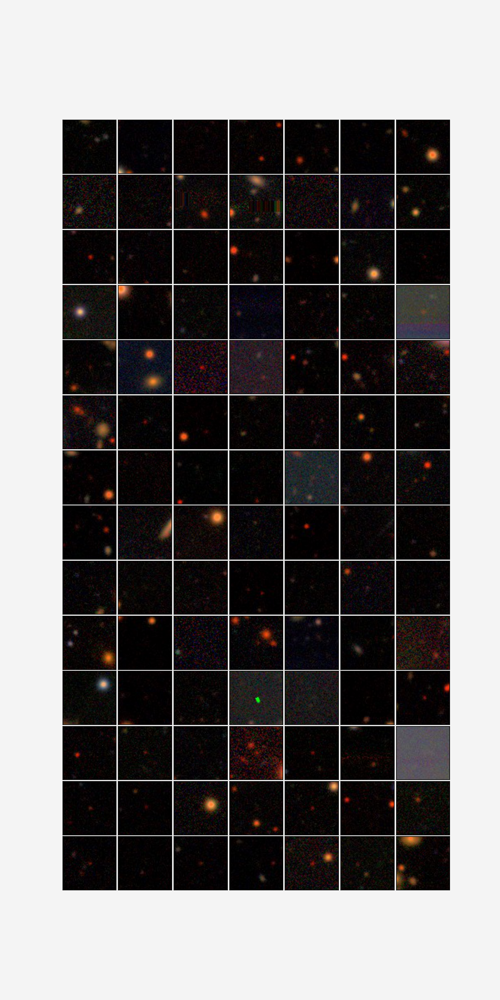

In [13]:
tile_start = 0
fs = np.array(glob.glob('/global/cfs/cdirs/des/myamamot/image_visualizations/data/odd_colors/DES*.fits'))
tilenames = np.array([f.split('/')[-1].split('_')[0] for f in fs])
print(np.unique(tilenames))
layout = np.arange(98).reshape(14, 7)
fig,ax = plt.subplot_mosaic(layout, figsize=(7,14), gridspec_kw={"wspace": 0.03,"hspace": 0.03,})
n = None

for i,filename in enumerate(fs):
    if i == 98:
        break

    dgri = fio.read(filename)

    norm = ImageNormalize(dgri, interval=ZScaleInterval(), stretch=LinearStretch())
    ax[i].imshow(dgri, norm=norm, origin='lower')
    ax[i].set_xticklabels([]); ax[i].set_xticks([])
    ax[i].set_yticklabels([]); ax[i].set_yticks([])
    

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0)
plt.savefig(outpath+'odd_colors.png', bbox_inches='tight')

## Find objects of interest

In [85]:
wide_cell_ids = np.array(d['cell_wide'][:])
coadd_obj_ids = np.array(d['uid'][:])
x = np.array(d['x'][:]); y = np.array(d['y'][:])
slice_id = np.array(d['slice_id'][:])
tilename = np.array(d['tilename'][:])

In [73]:
np.unique(wide_cell_ids)

array([  24,   25,   26,   27,   28,   29,   30,   31,   55,   56,   57,
         58,   59,   60,   61,   62,   63,  159,  191,  223,  406,  407,
        408,  414,  415,  438,  439,  440,  444,  445,  446,  447,  469,
        470,  471,  472,  473,  474,  475,  476,  477,  478,  479,  502,
        503,  504,  505,  506,  507,  508,  509,  510,  511,  536,  537,
        538,  539,  540,  541,  542,  543,  568,  569,  570,  571,  572,
        573,  574,  575,  600,  601,  602,  603,  604,  605,  606,  607,
        631,  632,  633,  634,  635,  636,  637,  638,  639,  640,  663,
        664,  665,  666,  667,  668,  669,  670,  671,  672,  673,  695,
        696,  697,  698,  699,  700,  701,  702,  703,  704,  705,  706,
        708,  730,  731,  732,  733,  734,  735,  736,  737,  738,  739,
        740,  741,  748,  761,  762,  763,  764,  765,  766,  767,  768,
        769,  770,  771,  772,  773,  774,  780,  781,  793,  794,  795,
        796,  797,  798,  799,  800,  801,  802,  8

In [86]:
cellids = [1017]#, 1016,  984,  985,  663,  415,  474,]
msk = np.in1d(wide_cell_ids, cellids)
wide_cell_ids = wide_cell_ids[msk]
coadd_obj_ids = coadd_obj_ids[msk]
x = x[msk]; y = y[msk]
slice_id = slice_id[msk]; tilename = tilename[msk]

In [87]:
print(len(wide_cell_ids))

96191


In [93]:
outpath = "/global/cfs/cdirs/des/myamamot/image_visualizations/data/highz_bin0_cell1017/"
idx_random = np.random.choice(np.arange(len(wide_cell_ids)), 100, replace=False)
for idx in tqdm(idx_random):
    
    obj_tile = tilename[idx].astype('str')
    obj_x = x[idx]; obj_y = y[idx]
    
    if not os.path.exists(os.path.join('/pscratch/sd/m/myamamot/des-y6-analysis/data/color_images', obj_tile+'-gri.jpg')):
        # print('downloading...')
        try:
            subprocess.run("wget --user des --password 70chips -P /global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images https://www.cosmo.bnl.gov/Private/gpfs/workarea/desdata/jpg/Y6A1_COADD/"+obj_tile+"/"+obj_tile+"-gri.jpg", shell=True, capture_output=True)
        except:
            print('downloading not successful')

    obj_x = int(obj_x) # int(obj['x'])
    obj_y = int(10000 - obj_y) # int(10000-obj['y'])

    im = plt.imread(f"""/global/cfs/cdirs/des/myamamot/image_visualizations/data/color_images/{obj_tile}-gri.jpg""", format='jpg')
    im_cutout = im[obj_y-32:obj_y+32, obj_x-32:obj_x+32]
    fio.write(outpath+obj_tile+'_gri'+str(idx)+'.fits', im_cutout)

100%|██████████| 100/100 [07:15<00:00,  4.36s/it]


## visualization

['DES0002-0124' 'DES0003+0252' 'DES0005+0001' 'DES0007-4457'
 'DES0010-4123' 'DES0011-3540' 'DES0017-3832' 'DES0017-5205'
 'DES0017-5914' 'DES0017-6456' 'DES0020-0333' 'DES0021-6039'
 'DES0023-3332' 'DES0023-4914' 'DES0024-5040' 'DES0028-3623'
 'DES0029-3540' 'DES0035-3749' 'DES0042-4748' 'DES0043-5705'
 'DES0047-3249' 'DES0050-5914' 'DES0055-2332' 'DES0058-2958'
 'DES0059-2915' 'DES0059-4748' 'DES0059-5957' 'DES0100-0250'
 'DES0100-2749' 'DES0107-1458' 'DES0107-6039' 'DES0111+0001'
 'DES0118-3415' 'DES0121-2541' 'DES0131-0207' 'DES0135-2915'
 'DES0136-0041' 'DES0136-1415' 'DES0142-0041' 'DES0145+0209'
 'DES0145-6456' 'DES0148+0126' 'DES0148-0041' 'DES0148-0250'
 'DES0148-0915' 'DES0148-6039' 'DES0149-0750' 'DES0149-1332'
 'DES0151-3706' 'DES0154+0252' 'DES0155-2249' 'DES0156-1250'
 'DES0159-5622' 'DES0200-0915' 'DES0201-3706' 'DES0202-0124'
 'DES0204-1041' 'DES0207-2332' 'DES0208-1541' 'DES0209+0335'
 'DES0210-1624' 'DES0211+0043' 'DES0212-5248' 'DES0214-0915'
 'DES0217-2749' 'DES0218

<ipython-input-95-ebbfd5eea272>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


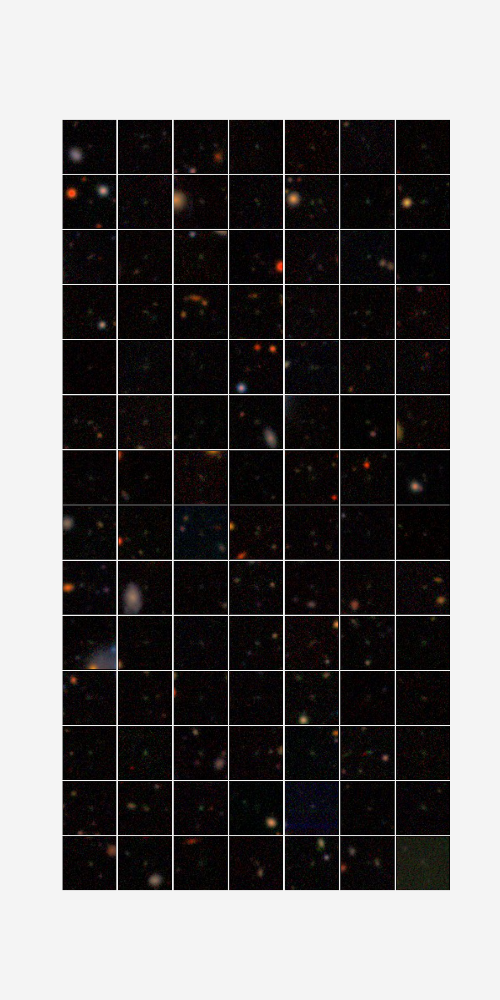

In [95]:
tile_start = 0
fs = np.array(glob.glob('/global/cfs/cdirs/des/myamamot/image_visualizations/data/highz_bin0_cell1017/DES*.fits'))
tilenames = np.array([f.split('/')[-1].split('_')[0] for f in fs])
print(np.unique(tilenames))
layout = np.arange(98).reshape(14, 7)
fig,ax = plt.subplot_mosaic(layout, figsize=(7,14), gridspec_kw={"wspace": 0.03,"hspace": 0.03,})
n = None

for i,filename in enumerate(fs):
    if i == 98:
        break

    dgri = fio.read(filename)

    norm = ImageNormalize(dgri, interval=ZScaleInterval(), stretch=LinearStretch())
    ax[i].imshow(dgri, norm=norm, origin='lower')
    ax[i].set_xticklabels([]); ax[i].set_xticks([])
    ax[i].set_yticklabels([]); ax[i].set_yticks([])
    

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0)
plt.savefig(outpath+'cell1017_viz.png', bbox_inches='tight')

## check weights, responses for those cells

In [96]:
weights = np.array(d['w'][:])
weights_cell = np.array(d['w'][:])[msk]

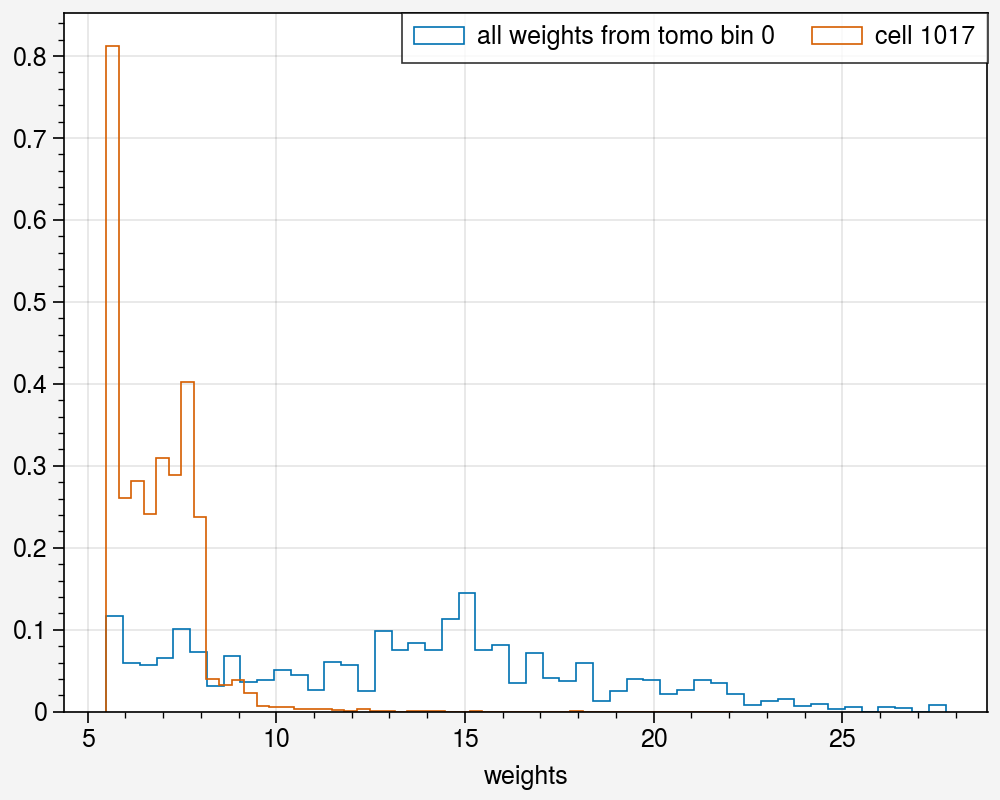

In [102]:
fig,ax = pplt.subplots(figsize=(5,4))
ax.hist(weights, bins=50, density=True, histtype='step', label='all weights from tomo bin 0')
ax.hist(weights_cell, bins=50, density=True, histtype='step', label='cell 1017')
ax.set_xlabel('weights')
ax.legend()

In [105]:
fluxerr_g = np.array(d['pgauss_band_flux_err_g'][:]); fluxerr_g_cell = fluxerr_g[msk]
fluxerr_r = np.array(d['pgauss_band_flux_err_r'][:]); fluxerr_r_cell = fluxerr_r[msk]
fluxerr_i = np.array(d['pgauss_band_flux_err_i'][:]); fluxerr_i_cell = fluxerr_i[msk]
fluxerr_z = np.array(d['pgauss_band_flux_err_z'][:]); fluxerr_z_cell = fluxerr_z[msk]

(-10.0, 200.0)

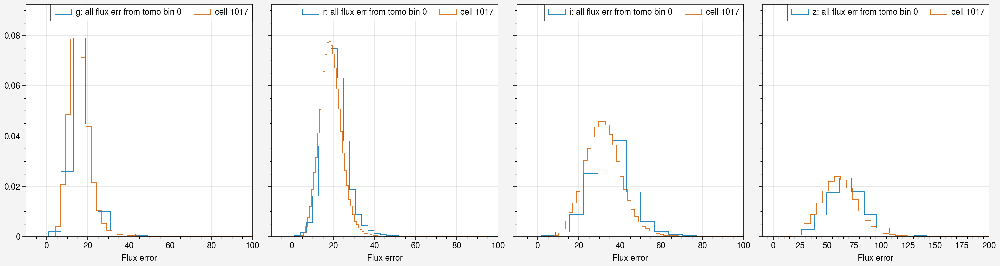

In [108]:
fig,ax = pplt.subplots(figsize=(15,4), nrows=1, ncols=4, sharex=False, sharey=True)
bins = 100
ax[0].hist(fluxerr_g, bins=bins, density=True, histtype='step', label='g: all flux err from tomo bin 0')
ax[0].hist(fluxerr_g_cell, bins=bins, density=True, histtype='step', label='cell 1017')
ax[0].legend()
ax[0].set_xlabel('Flux error')
ax[0].set_xlim(-10, 100)

ax[1].hist(fluxerr_r, bins=bins, density=True, histtype='step', label='r: all flux err from tomo bin 0')
ax[1].hist(fluxerr_r_cell, bins=bins, density=True, histtype='step', label='cell 1017')
ax[1].legend()
ax[1].set_xlabel('Flux error')
ax[1].set_xlim(-10, 100)

ax[2].hist(fluxerr_i, bins=bins, density=True, histtype='step', label='i: all flux err from tomo bin 0')
ax[2].hist(fluxerr_i_cell, bins=bins, density=True, histtype='step', label='cell 1017')
ax[2].legend()
ax[2].set_xlabel('Flux error')
ax[2].set_xlim(-10, 100)

ax[3].hist(fluxerr_z, bins=bins, density=True, histtype='step', label='z: all flux err from tomo bin 0')
ax[3].hist(fluxerr_z_cell, bins=bins, density=True, histtype='step', label='cell 1017')
ax[3].legend()
ax[3].set_xlabel('Flux error')
ax[3].set_xlim(-10, 200)



## check response in each wide cell

In [33]:
def assign_loggrid(x, y, xmin, xmax, xsteps, ymin, ymax, ysteps):
    """
    Computes indices of 2D grids. Only used when we use shear weight that is binned by S/N and size ratio. 
    """
    from math import log10
    # return x and y indices of data (x,y) on a log-spaced grid that runs from [xy]min to [xy]max in [xy]steps

    logstepx = log10(xmax/xmin)/xsteps
    logstepy = log10(ymax/ymin)/ysteps

    indexx = (np.log10(x/xmin)/logstepx).astype(int)
    indexy = (np.log10(y/ymin)/logstepy).astype(int)

    indexx = np.maximum(indexx,0)
    indexx = np.minimum(indexx, xsteps-1)
    indexy = np.maximum(indexy,0)
    indexy = np.minimum(indexy, ysteps-1)

    return indexx,indexy

def _find_shear_weight(dat, wgt_dict, snmin, snmax, sizemin, sizemax, steps, mdet_mom):

    """
    Assigns shear weights to the objects based on the grids. 
    """

    if wgt_dict is None:
        weights = np.ones(len(dat))
        return weights

    shear_wgt = wgt_dict['weight']
    smoothing = True
    if smoothing:
        from scipy.ndimage import gaussian_filter
        smooth_response = gaussian_filter(wgt_dict['response'], sigma=2.0)
        shear_wgt = (smooth_response/wgt_dict['meanes'])**2
    indexx, indexy = assign_loggrid(np.array(dat[mdet_mom+'_s2n']), np.array(dat[mdet_mom+'_T_ratio']), snmin, snmax, steps, sizemin, sizemax, steps)
    weights = np.array([shear_wgt[x, y] for x, y in zip(indexx, indexy)])
    response = np.array([smooth_response[x, y] for x, y in zip(indexx, indexy)])

    return weights, response

def _get_shear_weights(dat, gal_weight_file):

    with open(gal_weight_file, 'rb') as handle:
        wgt_dict = pickle.load(handle)
        snmin = wgt_dict['xedges'][0]
        snmax = wgt_dict['xedges'][-1]
        sizemin = wgt_dict['yedges'][0]
        sizemax = wgt_dict['yedges'][-1]
        steps = len(wgt_dict['xedges'])-1
    shear_wgt, shear_response = _find_shear_weight(dat, wgt_dict, snmin, snmax, sizemin, sizemax, steps, 'gauss')
    return shear_wgt, shear_response

def get_shear_response(f, tomobin, fweight):
    
    def _wmean(q,w):
        return np.sum(q*w)/np.sum(w)
    
    d_noshear = f.get('noshear/'+tomobin); w,r = _get_shear_weights(d_noshear, fweight)
    R_som = np.zeros(len(r), dtype=[('R','f8'), ('w','f8')])
    d_1p = f.get('1p/'+tomobin); e1_1p = np.array(d_1p['gauss_g_1'][:]); w_1p = np.array(d_1p['w'][:])
    d_1m = f.get('1m/'+tomobin); e1_1m = np.array(d_1m['gauss_g_1'][:]); w_1m = np.array(d_1m['w'][:])
    d_2p = f.get('2p/'+tomobin); e2_2p = np.array(d_2p['gauss_g_2'][:]); w_2p = np.array(d_2p['w'][:])
    d_2m = f.get('2m/'+tomobin); e2_2m = np.array(d_2m['gauss_g_2'][:]); w_2m = np.array(d_2m['w'][:])
    
    wide_cell_ids = np.array(d_noshear['cell_wide'][:])
    wide_cell_ids_1p = np.array(d_1p['cell_wide'][:])
    wide_cell_ids_1m = np.array(d_1m['cell_wide'][:])
    wide_cell_ids_2p = np.array(d_2p['cell_wide'][:])
    wide_cell_ids_2m = np.array(d_2m['cell_wide'][:])
    print(np.unique(wide_cell_ids), np.unique(wide_cell_ids_1p))
    
    unique_wide_cells = np.unique(wide_cell_ids_1p)
    R_wide = np.zeros(32*32)
    for wide in tqdm(unique_wide_cells):

        msk_1p = (wide_cell_ids_1p == wide)
        msk_1m = (wide_cell_ids_1m == wide)
        msk_2p = (wide_cell_ids_2p == wide)
        msk_2m = (wide_cell_ids_2m == wide)

        g1p = _wmean(e1_1p[msk_1p], w_1p[msk_1p])
        g1m = _wmean(e1_1m[msk_1m], w_1m[msk_1m])
        R11 = (g1p - g1m) / 0.02

        g2p = _wmean(e2_2p[msk_2p], w_2p[msk_2p])
        g2m = _wmean(e2_2m[msk_2m], w_2m[msk_2m])
        R22 = (g2p - g2m) / 0.02

        R = (R11 + R22)/2.
        R_wide[wide] = R
        
        msk = (wide_cell_ids == wide)
        R_som['R'][msk] = R
        R_som['w'][msk] = w[msk]
        
    R_resize = R_wide.reshape((32, 32))
    R_resize[R_resize == 0] = np.nan
    R_som_ave = np.average(R_som['R'], weights=R_som['w'])
    
    print(R_som_ave)
    return R_resize, R_som_ave

def get_grid_shear_response(f, tomobin, fweight):
    
    def _wmean(q,w):
        return np.sum(q*w)/np.sum(w)
    
    d = f.get('noshear/'+tomobin); w,r = _get_shear_weights(d, fweight)
    print(len(w))
    print('<R_grid> per bin=', np.average(r, weights=w))
    # d_1p = f.get('1p/'+tomobin); e1_1p = np.array(d_1p['gauss_g_1'][:]); w_1p,r_1p = _get_shear_weights(d_1p, f_weight)
    # d_1m = f.get('1m/'+tomobin); e1_1m = np.array(d_1m['gauss_g_1'][:]); w_1m,r_1m = _get_shear_weights(d_1m, f_weight)
    # d_2p = f.get('2p/'+tomobin); e2_2p = np.array(d_2p['gauss_g_2'][:]); w_2p,r_2p = _get_shear_weights(d_2p, f_weight)
    # d_2m = f.get('2m/'+tomobin); e2_2m = np.array(d_2m['gauss_g_2'][:]); w_2m,r_2m = _get_shear_weights(d_2m, f_weight)
    
    wide_cell_ids = np.array(d['cell_wide'][:])
    # wide_cell_ids_1p = np.array(d_1p['cell_wide'][:])
    # wide_cell_ids_1m = np.array(d_1m['cell_wide'][:])
    # wide_cell_ids_2p = np.array(d_2p['cell_wide'][:])
    # wide_cell_ids_2m = np.array(d_2m['cell_wide'][:])
    
    unique_wide_cells = np.unique(wide_cell_ids)
    R_wide = np.zeros(32*32)
    for wide in tqdm(unique_wide_cells):

        msk = (wide_cell_ids == wide)
        
        # msk_1p = (wide_cell_ids_1p == wide)
        # msk_1m = (wide_cell_ids_1m == wide)
        # msk_2p = (wide_cell_ids_2p == wide)
        # msk_2m = (wide_cell_ids_2m == wide)

        # g1p = _wmean(e1_1p[msk_1p], w_1p[msk_1p])
        # g1m = _wmean(e1_1m[msk_1m], w_1m[msk_1m])
        # R11 = (g1p - g1m) / 0.02

        # g2p = _wmean(e2_2p[msk_2p], w_2p[msk_2p])
        # g2m = _wmean(e2_2m[msk_2m], w_2m[msk_2m])
        # R22 = (g2p - g2m) / 0.02

        # R = (R11 + R22)/2.
        R = r[msk]
        R_wide[wide] = np.average(R, weights=w[msk])
    R_resize = R_wide.reshape((32, 32))
    R_resize[R_resize == 0] = np.nan
    
    return R_resize

In [34]:
R_bin0, R_bin0_ave = get_shear_response(f, 'tomo_bin_0', weight_file)
R_bin1, R_bin1_ave = get_shear_response(f, 'tomo_bin_1', weight_file)
R_bin2, R_bin2_ave = get_shear_response(f, 'tomo_bin_2', weight_file)
R_bin3, R_bin3_ave = get_shear_response(f, 'tomo_bin_3', weight_file)

[  24   25   26   27   28   29   30   31   55   56   57   58   59   60
   61   62   63  159  191  223  406  407  408  414  415  438  439  440
  444  445  446  447  469  470  471  472  473  474  475  476  477  478
  479  502  503  504  505  506  507  508  509  510  511  536  537  538
  539  540  541  542  543  568  569  570  571  572  573  574  575  600
  601  602  603  604  605  606  607  631  632  633  634  635  636  637
  638  639  640  663  664  665  666  667  668  669  670  671  672  673
  695  696  697  698  699  700  701  702  703  704  705  706  708  730
  731  732  733  734  735  736  737  738  739  740  741  748  761  762
  763  764  765  766  767  768  769  770  771  772  773  774  780  781
  793  794  795  796  797  798  799  800  801  802  803  804  805  813
  824  825  826  827  828  829  830  831  832  833  834  835  836  837
  838  841  845  856  857  858  861  862  863  864  865  866  869  870
  874  887  888  889  896  897  898  899  900  901  902  903  904  905
  906 

100%|██████████| 274/274 [01:48<00:00,  2.53it/s]


0.8561467823889891
[  15   16   17   23  341  352  373  374  384  385  386  416  417  418
  419  420  421  448  449  450  451  452  453  454  455  462  463  468
  480  481  482  483  484  485  486  487  488  489  490  491  492  493
  494  495  497  498  499  500  501  512  513  514  515  516  517  518
  519  520  521  522  523  524  525  530  531  532  533  534  535  544
  545  546  547  548  549  550  551  552  553  554  555  563  564  565
  566  567  576  577  578  579  580  581  582  583  584  585  586  587
  595  596  597  598  599  608  609  610  611  612  613  614  615  616
  617  618  619  627  628  629  630  641  642  643  644  645  646  647
  648  649  650  651  659  660  661  662  674  675  676  677  678  679
  680  681  682  683  684  685  690  691  692  693  694  707  709  710
  711  712  713  714  715  716  717  718  721  722  723  724  725  726
  727  728  729  742  743  744  745  746  747  749  750  751  752  753
  754  755  756  757  758  759  760  775  776  777  778  7

100%|██████████| 302/302 [02:10<00:00,  2.32it/s]


0.8685094825288583
[  6  18  19  20  21  22  37  38  51  52  53  54  68  69  70  71  72  84
  85  86  98  99 100 101 102 103 104 105 116 117 118 128 129 130 131 132
 133 134 135 136 137 138 149 160 161 162 163 164 165 166 167 168 169 170
 171 181 192 193 194 195 196 197 198 199 200 201 202 203 204 205 212 213
 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241
 242 243 244 245 256 257 258 259 260 261 262 263 264 265 266 268 269 270
 271 272 273 274 275 276 277 288 289 290 291 292 293 294 295 296 297 298
 301 302 303 304 305 306 307 308 309 310 320 321 322 323 324 325 326 327
 328 329 330 331 334 335 336 337 338 339 340 342 353 354 355 356 357 358
 359 360 361 362 363 364 366 367 368 369 370 371 372 387 388 389 390 391
 392 393 394 395 396 397 398 399 400 401 402 403 404 405 422 423 424 425
 426 427 428 429 430 431 432 433 434 435 436 437 456 457 458 459 460 461
 464 465 466 467 496 526 527 528 529 556 557 558 559 560 561 562 588 589
 590 591 592 593 594 620 621 622

100%|██████████| 259/259 [01:50<00:00,  2.35it/s]


0.8194456097683659
[  0   1   2   3   4   5   7   8   9  10  11  12  13  14  32  33  34  35
  36  39  40  41  42  43  44  45  46  47  48  49  50  64  65  66  67  73
  74  75  76  77  78  79  80  81  82  83  87  88  89  90  91  92  93  94
  95  96  97 106 107 108 109 110 111 112 113 114 115 119 120 121 122 123
 124 125 126 127 139 140 141 142 143 144 145 146 147 148 150 151 152 153
 154 155 156 157 158 172 173 174 175 176 177 178 179 180 182 183 184 185
 186 187 188 189 190 206 207 208 209 210 211 214 215 216 217 218 219 220
 221 222 246 247 248 249 250 251 252 253 254 255 267 278 279 280 281 282
 283 284 285 286 287 299 300 311 312 313 314 315 316 317 318 319 332 333
 343 344 345 346 347 348 349 350 351 365 375 376 377 378 379 380 381 382
 383 409 410 411 412 413 441 442 443] [  0   1   2   3   4   5   7   8   9  10  11  12  13  14  32  33  34  35
  36  39  40  41  42  43  44  45  46  47  48  49  50  64  65  66  67  73
  74  75  76  77  78  79  80  81  82  83  87  88  89  90  91  92  9

100%|██████████| 189/189 [01:48<00:00,  1.75it/s]


0.6917791325462793


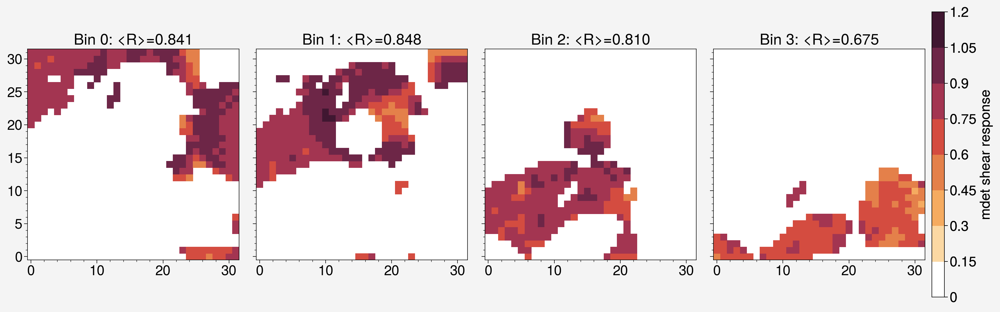

In [8]:

matplotlib.rcParams.update({'font.size': 16})
fig,ax = pplt.subplots(figsize=(16,5), nrows=1, ncols=4)

X, Y = np.meshgrid(np.arange(32), np.arange(32))
mesh = ax[0].pcolormesh(X, Y, R_bin0, vmin=0, vmax=1.25)
ax[0].set_aspect(1)
ax[0].set_title('Bin 0: <R>='+"{:.3f}".format(np.nanmean(R_bin0)))

mesh = ax[1].pcolormesh(X, Y, R_bin1, vmin=0, vmax=1.25)
ax[1].set_aspect(1)
ax[1].set_title('Bin 1: <R>='+"{:.3f}".format(np.nanmean(R_bin1)))

mesh = ax[2].pcolormesh(X, Y, R_bin2, vmin=0, vmax=1.25)
ax[2].set_aspect(1)
ax[2].set_title('Bin 2: <R>='+"{:.3f}".format(np.nanmean(R_bin2)))

mesh = ax[3].pcolormesh(X, Y, R_bin3, vmin=0, vmax=1.25)
ax[3].set_aspect(1)
ax[3].set_title('Bin 3: <R>='+"{:.3f}".format(np.nanmean(R_bin3)))
fig.colorbar(mesh,ax=ax[3],label='mdet shear response')

In [28]:
R_grid_bin0 = get_grid_shear_response(f, 'tomo_bin_0', weight_file)
R_grid_bin1 = get_grid_shear_response(f, 'tomo_bin_1', weight_file)
R_grid_bin2 = get_grid_shear_response(f, 'tomo_bin_2', weight_file)
R_grid_bin3 = get_grid_shear_response(f, 'tomo_bin_3', weight_file)

33707071
<R_grid> per bin= 0.8576799620818517


100%|██████████| 274/274 [00:19<00:00, 13.94it/s]


34580888
<R_grid> per bin= 0.8281168243611132


100%|██████████| 302/302 [00:22<00:00, 13.15it/s]


34646416
<R_grid> per bin= 0.8134571183559123


100%|██████████| 259/259 [00:18<00:00, 13.68it/s]


36727798
<R_grid> per bin= 0.7353940305755107


100%|██████████| 189/189 [00:18<00:00, 10.37it/s]


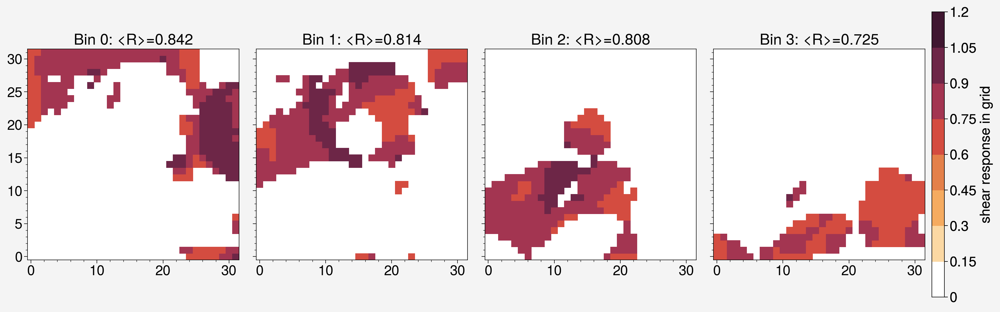

In [20]:
matplotlib.rcParams.update({'font.size': 16})
fig,ax = pplt.subplots(figsize=(16,5), nrows=1, ncols=4)

X, Y = np.meshgrid(np.arange(32), np.arange(32))
mesh = ax[0].pcolormesh(X, Y, R_grid_bin0, vmin=0, vmax=1.25)
ax[0].set_aspect(1)
ax[0].set_title('Bin 0: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin0)))

mesh = ax[1].pcolormesh(X, Y, R_grid_bin1, vmin=0, vmax=1.25)
ax[1].set_aspect(1)
ax[1].set_title('Bin 1: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin1)))

mesh = ax[2].pcolormesh(X, Y, R_grid_bin2, vmin=0, vmax=1.25)
ax[2].set_aspect(1)
ax[2].set_title('Bin 2: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin2)))

mesh = ax[3].pcolormesh(X, Y, R_grid_bin3, vmin=0, vmax=1.25)
ax[3].set_aspect(1)
ax[3].set_title('Bin 3: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin3)))
fig.colorbar(mesh,ax=ax[3],label='shear response in grid')

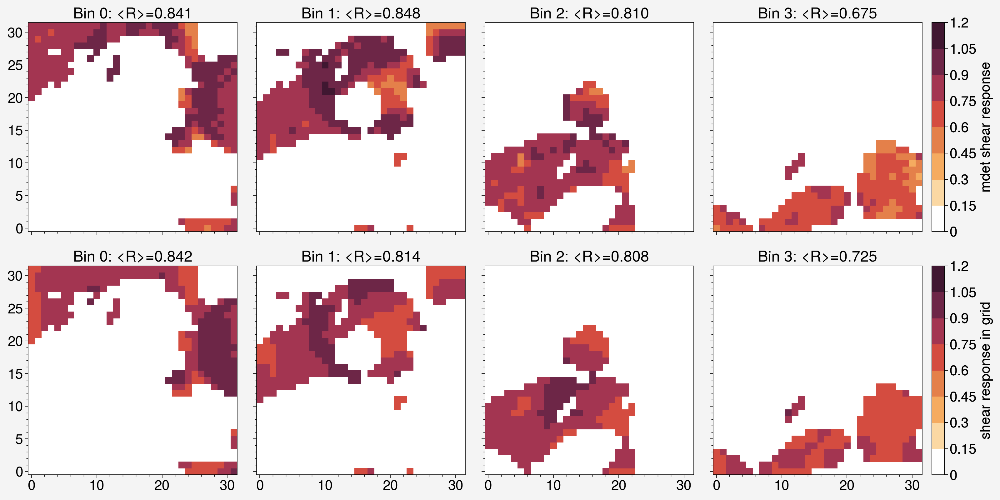

In [21]:
matplotlib.rcParams.update({'font.size': 16})
fig,ax = pplt.subplots(figsize=(16,8), nrows=2, ncols=4)

X, Y = np.meshgrid(np.arange(32), np.arange(32))
mesh = ax[0,0].pcolormesh(X, Y, R_bin0, vmin=0, vmax=1.25)
ax[0,0].set_aspect(1)
ax[0,0].set_title('Bin 0: <R>='+"{:.3f}".format(np.nanmean(R_bin0)))

mesh = ax[0,1].pcolormesh(X, Y, R_bin1, vmin=0, vmax=1.25)
ax[0,1].set_aspect(1)
ax[0,1].set_title('Bin 1: <R>='+"{:.3f}".format(np.nanmean(R_bin1)))

mesh = ax[0,2].pcolormesh(X, Y, R_bin2, vmin=0, vmax=1.25)
ax[0,2].set_aspect(1)
ax[0,2].set_title('Bin 2: <R>='+"{:.3f}".format(np.nanmean(R_bin2)))

mesh = ax[0,3].pcolormesh(X, Y, R_bin3, vmin=0, vmax=1.25)
ax[0,3].set_aspect(1)
ax[0,3].set_title('Bin 3: <R>='+"{:.3f}".format(np.nanmean(R_bin3)))
fig.colorbar(mesh,ax=ax[0,3],label='mdet shear response')


mesh = ax[1,0].pcolormesh(X, Y, R_grid_bin0, vmin=0, vmax=1.25)
ax[1,0].set_aspect(1)
ax[1,0].set_title('Bin 0: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin0)))

mesh = ax[1,1].pcolormesh(X, Y, R_grid_bin1, vmin=0, vmax=1.25)
ax[1,1].set_aspect(1)
ax[1,1].set_title('Bin 1: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin1)))

mesh = ax[1,2].pcolormesh(X, Y, R_grid_bin2, vmin=0, vmax=1.25)
ax[1,2].set_aspect(1)
ax[1,2].set_title('Bin 2: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin2)))

mesh = ax[1,3].pcolormesh(X, Y, R_grid_bin3, vmin=0, vmax=1.25)
ax[1,3].set_aspect(1)
ax[1,3].set_title('Bin 3: <R>='+"{:.3f}".format(np.nanmean(R_grid_bin3)))
fig.colorbar(mesh,ax=ax[1,3],label='shear response in grid')

## new response weighting scheme